#### Импортируем модули:

In [1]:
import cv2
import json

import numpy as np
from torch.utils.data import Dataset, DataLoader
import os, random, time, shutil
import torch, torchvision
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.utils as vutils
from torch.utils.tensorboard import SummaryWriter
from PIL import Image 
from tqdm import tqdm
import cv2

from PIL import Image, ImageDraw, ImageFont
from  matplotlib import pyplot as plt
from tqdm.auto import tqdm
%matplotlib inline

from torchvision.ops.boxes import box_iou
from mean_average_precision import MetricBuilder
from torchmetrics.detection.mean_ap import MeanAveragePrecision


#### Устанавливаем SEED:

In [2]:
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

import warnings
warnings.filterwarnings("ignore")

#### **Примечание**

Символ ✅ показывает, что пункт из ДЗ выполнен.

#### ¡Here we go!

#### Словарь меток для предобученной Faster-RCNN для датасета COCO

In [3]:
class_names = {
    0: 'background',  # Фоновый класс
    1: 'ballon',
    2: 'bicycle',
    3: 'car',
    4: 'motorcycle',
    5: 'airplane',
    6: 'bus',
    7: 'train',
    8: 'truck',
    9: 'boat',
    10: 'traffic light',
    11: 'fire hydrant',
    12: 'street sign',
    13: 'stop sign',
    14: 'parking meter',
    15: 'bench',
    16: 'bird',
    17: 'cat',
    18: 'dog',
    19: 'horse',
    20: 'sheep',
    21: 'cow',
    22: 'elephant',
    23: 'bear',
    24: 'zebra',
    25: 'giraffe',
    26: 'hat',
    27: 'backpack',
    28: 'umbrella',
    29: 'shoe',
    30: 'eye glasses',
    31: 'handbag',
    32: 'tie',
    33: 'suitcase',
    34: 'frisbee',
    35: 'skis',
    36: 'snowboard',
    37: 'sports ball',
    38: 'kite',
    39: 'baseball bat',
    40: 'baseball glove',
    41: 'skateboard',
    42: 'surfboard',
    43: 'tennis racket',
    44: 'bottle',
    45: 'plate',
    46: 'wine glass',
    47: 'cup',
    48: 'fork',
    49: 'knife',
    50: 'spoon',
    51: 'bowl',
    52: 'banana',
    53: 'apple',
    54: 'sandwich',
    55: 'orange',
    56: 'broccoli',
    57: 'carrot',
    58: 'hot dog',
    59: 'pizza',
    60: 'donut',
    61: 'cake',
    62: 'chair',
    63: 'couch',
    64: 'potted plant',
    65: 'bed',
    66: 'mirror',
    67: 'dining table',
    68: 'window',
    69: 'desk',
    70: 'toilet',
    71: 'door',
    72: 'tv',
    73: 'laptop',
    74: 'mouse',
    75: 'remote',
    76: 'keyboard',
    77: 'cell phone',
    78: 'microwave',
    79: 'oven',
    80: 'toaster',
    81: 'sink',
    82: 'refrigerator',
    83: 'blender',
    84: 'book',
    85: 'clock',
    86: 'vase',
    87: 'scissors',
    88: 'teddy bear',
    89: 'hair drier',
    90: 'toothbrush',
    91: 'hair brush'
}


#### Дополнительная функция для визуализаций:

In [5]:
def get_random_colors(num_classes):
    
    '''Вспомогательная функция, чтобы разными цветами отрисовывать bbox'ы при многоклассовой детекции'''
    
    colors = []
    for _ in range(num_classes):
        color = tuple(np.random.randint(0, 256, size=3).tolist())
        colors.append(color)
    return colors

colors = get_random_colors(91)
red_color = (255, 0, 0)
colors[1] = red_color
colors[37] = red_color

#### Здесь объявлены базовый transform, базовая и продвинутая аугментации.

#### Продвинутая аугментиация затронет изменение bounding box'ов, что удовлетворяет пункту 1.3 в условиях к домашнему заданию. 

#### Базовая аугментация удовлетворяет пункту 1.2. условий к домашнему заданию.  

In [6]:
base_transform = transforms.Compose([
                                    transforms.ToTensor(), 
                                    ])

base_augmentation = transforms.Compose([
                                    transforms.ToTensor(), 
                                    transforms.GaussianBlur(kernel_size = (45, 45)),
                                    transforms.ColorJitter(brightness=1, hue=.3),
                                    ])

advanced_augmenation = transforms.Compose([
                                    transforms.ToTensor(), 
                                    transforms.RandomHorizontalFlip(p=1.0)])

#### Объявляем train_path + test_path для изображений и аннотаций к изображениям:

In [24]:
images_train_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_train/images'
json_train_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/train_annotations_full.json'

images_test_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images'
json_test_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/oi5_ball_filename_to_bbox_val.json'

#### Функция получения новых папок с изображениями для train и для test:

Здесь реализована базовая и сложная аугментации ✅ ✅

In [ ]:
def image_augmentation(transfrom_techniques,
                       image_dir="/Users/chervonikov_alexey/Downloads/seminar_objdet_retina_oi5_ball/oi5_ball",
                  json_link="/Users/chervonikov_alexey/Downloads/seminar_objdet_retina_oi5_ball/oi5_ball_filename_to_bbox_train.json",
                  out_folder='augmented_dataset', json_output = 'train_annotations.json', IS_TRAIN = True):
    '''
    Вспомогательная функция для построения директорий с train и test изображениями
    
    Ключевые параметры:
    
    -transform_techniques: методы трансформации и аугментаций изображений
    -IS_TRAIN: флаг тренировочного датасета (будет применять аугментации)
    '''
    json_dict = {}

    if IS_TRAIN:
        new_out_folder = out_folder + '_train'
    else:
        new_out_folder = out_folder + '_test'

    # New folder for augmented images:
    augmented_image_dir = os.path.join(new_out_folder, "images")
    os.makedirs(augmented_image_dir, exist_ok=True)

    try:
        with open(json_link, 'r') as f:
            data = json.load(f)
    except json.JSONDecodeError as e:
        print(f"Error while loading JSON: {e}")

    for i, file in enumerate(tqdm(list(data.keys()))):
        if file.endswith(".jpg"):

            image = Image.open(file)
            # JSON Annotations:

            # New name for augmented image
            new_file_name = "augmentated_image_" + os.path.basename(file)
            new_image_path = os.path.join(augmented_image_dir, new_file_name)

            # New name for flipped image
            new_file_name_flipped = "flipped_image_" + os.path.basename(file)
            new_image_path_flipped = os.path.join(augmented_image_dir, new_file_name_flipped)

            # classic transform
            transformed_image = transfrom_techniques[0](image)

            # classic augmemntation
            augmented_image = transfrom_techniques[1](image)

            # horizontal_flip
            advanced_augmented_image = transfrom_techniques[2](image)

            transformed_image = transforms.ToPILImage()(transformed_image)
            augmented_image = transforms.ToPILImage()(augmented_image)
            advanced_augmented_image = transforms.ToPILImage()(advanced_augmented_image)

            file_upd = os.path.basename(file)

            if IS_TRAIN:
                transformed_image.save(os.path.join(augmented_image_dir, file_upd))
                augmented_image.save(new_image_path)
                advanced_augmented_image.save(new_image_path_flipped)

                initial_bboxes = data[file]

                json_dict[file_upd] = initial_bboxes
                json_dict[new_file_name] = initial_bboxes
                json_dict[new_file_name_flipped] = []

                draw = ImageDraw.Draw(advanced_augmented_image)

				# Вот здесь реализуется логика отзеркаливания bbox'ов 
                for bbox in initial_bboxes:
                    x1, x2, y1, y2 = bbox

                    tmp = x2
                    x2 = (1 - x1)
                    x1 = (1 - tmp)
                    y1 = y1
                    y2 = y2 

                    json_dict[new_file_name_flipped].append([x1, x2, y1, y2])

                    draw.rectangle([(x1, y1), (x2, y2)], outline="red", width = 2)
                    plt.imshow(advanced_augmented_image)

                with open(json_output, 'w') as json_file:
                    json.dump(json_dict, json_file)
            else:
                transformed_image.save(os.path.join(augmented_image_dir, file_upd))
                initial_bboxes = data[file]

                json_dict[file_upd] = initial_bboxes

        
    print('Initial number of pics:', len(os.listdir(image_dir)))
    print('After augmentations:', len(os.listdir(new_out_folder + '/images')))

# Сохранит в обновленную папку для train
image_augmentation([base_transform, base_augmentation, advanced_augmenation])

#### Для валидации:

In [ ]:
# Сохранит в обновленную папку для val
image_augmentation([base_transform, base_augmentation, advanced_augmenation],
                   json_link="/Users/chervonikov_alexey/Downloads/seminar_objdet_retina_oi5_ball/oi5_ball_filename_to_bbox_val.json",
                  out_folder='augmented_dataset', json_output = 'test_annotations.json', IS_TRAIN = False)

#### В общем, датасеты были получены, затем загружены на Kaggle. Там и проходило обучение моделей:

#### Вспомогательные функции для отрисовки input изображения:

#### 1. plot_instance_image()

#### 2. plot_instance_image_tensor()

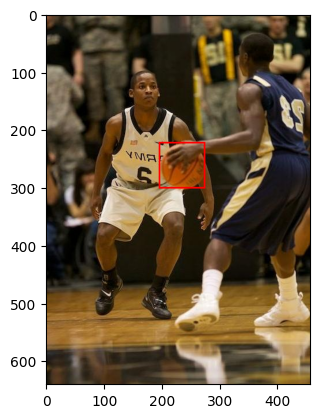

In [ ]:
def plot_instance_image(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_train/images/flipped_image_0555.jpg',
                         json_annotations = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/train_annotations_full.json'):
    
	'''
    Вспомогательная функция для отрисовки изображения по пути
    
    Параметры:
    -image_path: путь к изображению 
    -json_annotations: аннотации к изображениям (распарсится в словарь, 
    											откуда возьмутся аннотации)
    Делает plot изображения с bbox'ами
    '''
     
	image_pil = Image.open(image_path)
	img_torch = transforms.ToTensor()(image_pil)
	
	transformed_image = transforms.ToPILImage()(img_torch)

	width, height = image_pil.size
	jpg_name = os.path.basename(image_path)
	draw = ImageDraw.Draw(transformed_image)
	try:
		with open(json_annotations, 'r') as f:
			data = json.load(f)
	except json.JSONDecodeError as e:
		print(f"Error while loading JSON: {e}")

	
	bboxes = data[jpg_name]
	class_detect = ['none', 'ball']
	for bbox in bboxes:

		x1, x2, y1, y2 = bbox
		x1 = int(x1*width)
		x2 = int(x2*width)
		y1 = int(y1*height)
		y2 = int(y2*height)

		draw.rectangle([(x1, y1), (x2, y2)], outline="red", width = 3)
	plt.imshow(transformed_image)

def plot_instance_image_tensor(tensor_image,
								bboxes, label_colors = None,
								text_names = None, scores = None,
								scale_factor = True,
								base_use = False):
    
    '''
    Вспомогательная функция для отрисовки изображения по тензору и входным меткам
     
    Ключевые параметры:
    -tensor_image: изображение в форме torch.tensor
    -bboxes: массив bbox'ов
    -base_use: используется ли базовая модель, обученная на COCO датасете
    
    Делает plot ищображения с bbox'ами (name, score - опционально)
    '''
    
    plt.figure(figsize=(7, 7))
    image_pil = transforms.ToPILImage()(tensor_image)

    width, height = image_pil.size
    draw = ImageDraw.Draw(image_pil)
    font_size = 20
    font = ImageFont.load_default(font_size)

    if scale_factor:

      for bbox in bboxes:

          x1, y1, x2, y2 = bbox
          x1 = float(x1)
          x2 = float(x2)
          y1 = float(y1)
          y2 = float(y2)
          draw.rectangle([(x1, y1), (x2, y2)], outline="red", width = 3)
    else:
      for bbox, name, color, score in zip(bboxes, text_names, label_colors, scores):
          if base_use:
            if name == 'sports ball':

              x1, y1, x2, y2 = bbox
              x1 = float(x1)
              x2 = float(x2)
              y1 = float(y1)
              y2 = float(y2)
              draw.rectangle([(x1, y1), (x2, y2)], outline='red', width = 1)
              draw.text((x1, y1 - 10), f'{name} {score.item():.2f}', fill=color, font=font)
          else:
              x1, y1, x2, y2 = bbox
              x1 = float(x1)
              x2 = float(x2)
              y1 = float(y1)
              y2 = float(y2)
              draw.rectangle([(x1, y1), (x2, y2)], outline='red', width = 1)
              draw.text((x1, y1+20), f'{name} {score.item():.2f}', fill=color, font=font)
            

    plt.imshow(image_pil)

plot_instance_image()

#### Отрисовалось верно. Продемонстрирую дополнительно аугментацию поворота:

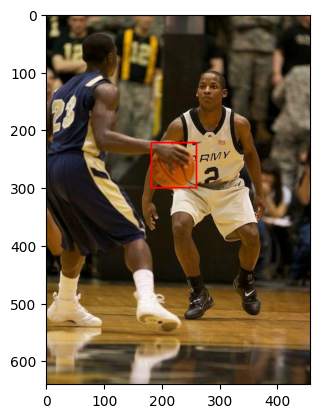

In [12]:
plot_instance_image(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_train/images/0555.jpg',
                         json_annotations = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/train_annotations_full.json')
    

#### Поворот сработал, значит, все сделано верно! ✅

#### Итак, получены две папки для train и val.

#### Здесь объявлены вспомогательные функции для реализации класса Датасета:

In [ ]:
def get_box(key_value, width, height):
    x1 = float(key_value[0])
    x2 = float(key_value[1])
    y1 = float(key_value[2])
    y2 = float(key_value[3])
    
    x1 = float(x1*768)
    x2 = float(x2*768)
    y1 = float(y1*768)
    y2 = float(y2*768)
    return [x1, y1, x2, y2]

def get_label(dict, jpg_name):
    if (dict[jpg_name]):
        return 1 # class ball
    return 0 

def get_bbox_labels(image_id, jpg_name, json_file, width, height):
    try:
        with open(json_file, 'r') as f:
            data = json.load(f)
    except json.JSONDecodeError as e:
        print(f"Error while loading JSON: {e}")
    
    key_value = data[jpg_name]
    labels = []
    bboxes = []
    for i in range(len(key_value)):
        bboxes.append(get_box(data[jpg_name][i], width, height))
        labels.append(get_label(data, jpg_name))

    bboxes = torch.as_tensor(bboxes, dtype=torch.float32)
    labels = torch.as_tensor(labels, dtype=torch.int64)
    image_id = torch.tensor([image_id])

    target = {}
    target["boxes"] = bboxes
    target["labels"] = labels
    target["image_id"] = image_id

    return target

# Примерный output, как будут выглядеть данные по изображению
image_pil = Image.open('/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_train/images/0256.jpg')
example_target = get_bbox_labels(1, '0256.jpg', json_train_path, image_pil.size[0], image_pil.size[1])
print(example_target)

{'boxes': tensor([[237.6000, 636.5061, 285.6000, 718.4517],
        [415.2000, 682.2428, 469.1996, 766.0946],
        [461.9996, 636.5061, 509.9996, 714.6401],
        [471.5996, 586.9578, 517.1996, 632.6945],
        [564.0000, 602.2034, 608.4004, 670.8088],
        [720.0000, 564.0891, 759.5996, 623.1660]]), 'labels': tensor([1, 1, 1, 1, 1, 1]), 'image_id': tensor([1])}


#### Количество изображения в train и val (test):

In [16]:
names_train = []
for file in os.listdir(images_train_path):
    names_train.append(os.path.basename(file))

names_test = []
for file in os.listdir(images_test_path):
    names_test.append(os.path.basename(file))

In [18]:
names_train[0]

'flipped_image_2552.jpg'

In [17]:
print(len(names_train), len(names_test))

8625 226


#### Класс-датасет:

In [20]:
class BallDetectionDataset(Dataset):
    
	'''
	Класс, реализующий датасет torch, для преобрзования его в DataLoader и 
	подачи сэмлов в сеть
	'''

	def __init__(self, image_path, names_list, json_file, transforms=None, IS_TRAIN = True):

		'''
		Конструктор __init__()
		
		Параметры:
		-image_path: пути к изображениям (путь к папке)
		-names_list: массив путей изображений по конечному названию файла (например, 'flipped_image_2552.jpg')
		-json_file: ссылка на файл с аннотациями
		-transforms: как будем трансформировать изображения в __getitem__()
		-IS_TRAIN: Флаг train/test (Костыльно, но нужно было для правильной обработки путей)
		
		'''

		self.images_path = image_path
		self.names_list = names_list
		self.transforms = transforms
		self.json_file = json_file
		self.is_train = IS_TRAIN

	def __getitem__(self, index):

		'''
		Функция __getitem__()

		-Возвращает по index само изображение (torch.tensor) и его аннотации (bboxes, labels, id)

		'''

		name_jpg = self.names_list[index]
		file_label = self.json_file
		file_image = self.images_path + '/' + name_jpg
		if not self.is_train:
			name_jpg = 'oi5_ball/' + name_jpg
		image = Image.open(file_image).convert("RGB")
		width, height = image.size

		labels = get_bbox_labels(index, name_jpg, file_label, width, height)

		if self.transforms is not None:
			image = self.transforms(image)
		
		return image, labels

	def __len__(self):
		'''
		Функция __len__()
		
		-Вернет размер датасета по длина массива имен
		'''
		return len(self.names_list)


In [26]:
# Решил для удобства привести всё к одному размеру
to_tensor_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((768, 768))
    ])

train_dataset = BallDetectionDataset(image_path=images_train_path,
                                     names_list=names_train,
                                     json_file=json_train_path,
                                    transforms=to_tensor_transform)

test_dataset = BallDetectionDataset(image_path=images_test_path,
                                     names_list=names_test,
                                     json_file=json_test_path,
                                    transforms=to_tensor_transform, IS_TRAIN=False)

# Вспомогательный словарь для класс 'ball'
labels_to_name = {1: 'ball'}

#### Пример работы датасета:

In [27]:
image, labels = test_dataset[3]

In [28]:
labels

{'boxes': tensor([[382.7996, 526.4003, 411.5996, 558.3997]]),
 'labels': tensor([1]),
 'image_id': tensor([3])}

In [29]:
image.size()

torch.Size([3, 768, 768])

#### Делаем тест (Done):

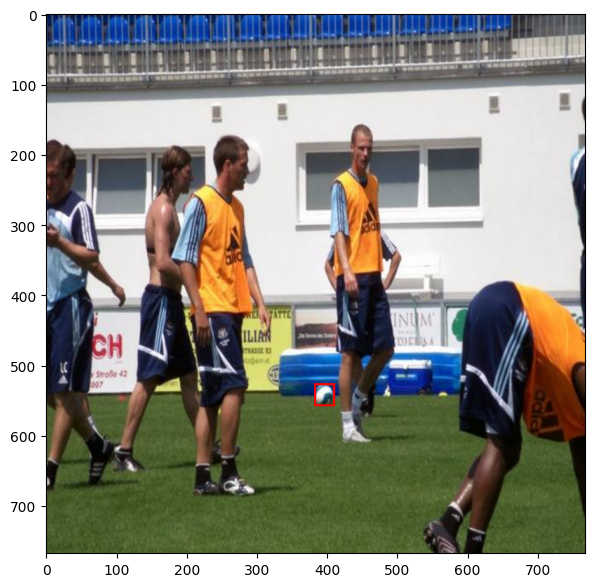

In [30]:
plot_instance_image_tensor(image, labels['boxes'])

#### Датасет реализован и работает, это удовлетворяет пункту 1.1. условия домашнего задания ✅

#### Загружаем DataLoaders:

In [32]:
def collate_fn(batch): 
    '''Вспомогательная функця для упаковки в батчи''' 
    return tuple(zip(*batch)) 

batch_size = 16

train_data_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, collate_fn=collate_fn, shuffle=True)

val_data_loader = torch.utils.data.DataLoader(
    test_dataset, batch_size=batch_size, collate_fn=collate_fn, shuffle=False)

#### Итерируемся по DataLoader'у, всё работает ✅:

In [33]:
for imgs, annotations in train_data_loader:
    imgs = list([img.to('cpu') for img in imgs])
    annotations = [{k: v.to('cpu') for k, v in t.items()} for t in annotations]
    print(annotations)
    break

[{'boxes': tensor([[281.2800,  16.5235, 313.9200,  67.5325]]), 'labels': tensor([1]), 'image_id': tensor([88])}, {'boxes': tensor([[101.2800, 399.9998, 570.7200, 767.2727]]), 'labels': tensor([1]), 'image_id': tensor([5766])}, {'boxes': tensor([[504.9600, 426.5864, 585.6000, 548.5717]]), 'labels': tensor([1]), 'image_id': tensor([7016])}, {'boxes': tensor([[125.3583, 610.8879, 139.7675, 641.3860]]), 'labels': tensor([1]), 'image_id': tensor([5710])}, {'boxes': tensor([[ 32.6400, 456.3203,  56.6400, 487.6800]]), 'labels': tensor([1]), 'image_id': tensor([5630])}, {'boxes': tensor([[729.1200, 523.4412, 755.5200, 565.2733]]), 'labels': tensor([1]), 'image_id': tensor([2685])}, {'boxes': tensor([[166.5600, 232.8584, 183.3600, 261.0624]]), 'labels': tensor([1]), 'image_id': tensor([6453])}, {'boxes': tensor([[  1.9200, 440.1761, 115.2000, 511.7437]]), 'labels': tensor([1]), 'image_id': tensor([2016])}, {'boxes': tensor([[593.7600, 660.9715, 637.9200, 698.5767],
        [444.9600, 639.2770, 

#### Сделаем plot изображения внутри batch'а:

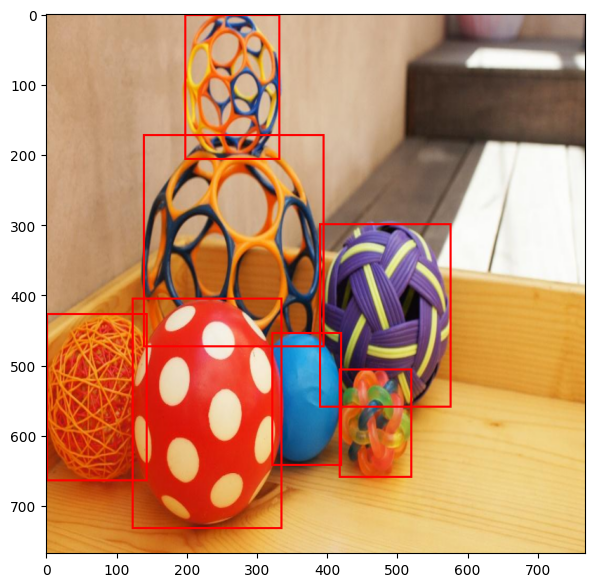

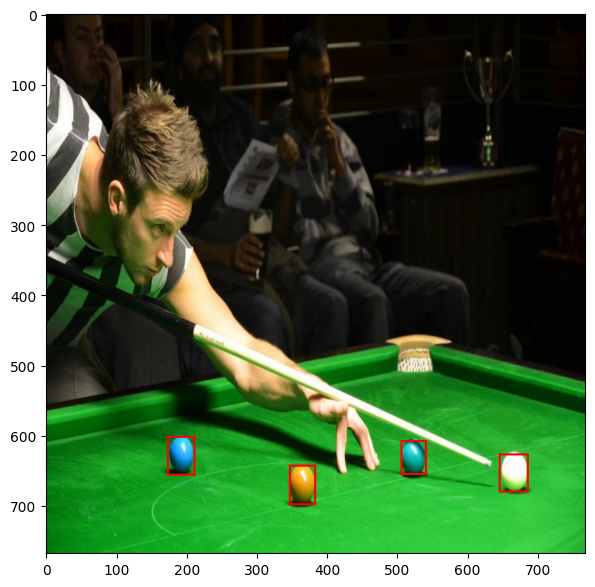

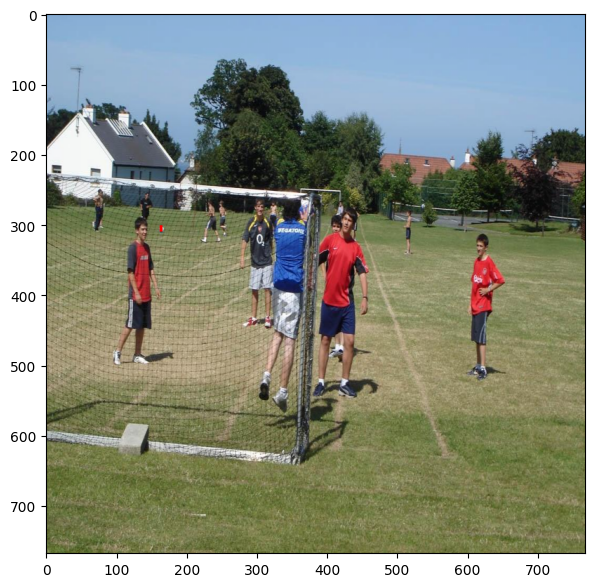

In [34]:
for i, batch in enumerate(train_data_loader):
    imgs, annotations = batch
    tmp_img = imgs[2]

    tmp_boxes = annotations[2]['boxes']
    # print(tmp_img)
    plot_instance_image_tensor(tmp_img, tmp_boxes)
    if i >= 2:
        break


#### Здесь объявляется функция predict'а и визуализации:

In [ ]:
def detect_visualize(image_path,
                    detection_model,
                  	threshold = 0.5,
                 	base_use = False,
                    device = 'cpu'):
  
  ''' 
  Функция детекции и визуализации

  Параметры:
  -image_path: путь к изображению
  -detection_model: модель
  -threshold: порог по scores
  -base_use: базовая модель для COCO датасета
  -device: 'cpu'
  '''

  detection_model.to(device)

  image_pil = Image.open(image_path)
  if image_pil.mode == 'RGBA':
    image_pil = image_pil.convert('RGB')
  img_torch = transforms.ToTensor()(image_pil)
  img_torch = to_tensor_transform(image_pil)
  transformed_image = transforms.ToPILImage()(img_torch)

  width, height = transformed_image.size

  fictious_batch = [img_torch]

  with torch.no_grad():

    images = [image.to(device) for image in fictious_batch]
    model_output = detection_model(images)
    boxes = model_output[0]['boxes']
    labels = model_output[0]['labels']
    scores = model_output[0]['scores']

    boxes = boxes[scores > threshold]
    labels = labels[scores > threshold]
    scores = scores[scores > threshold]
    

    predicted_labels = []
    predicted_colors = []

    for box, label, score in zip(boxes, labels, scores):

          class_name = class_names[label.item()]
          class_color = colors[label.item()]

          print(f'Class: {class_name}, Score: {score.item()}, Box: {box}')
          predicted_colors.append(class_color)
          predicted_labels.append(class_name)
    if base_use:
        

        plot_instance_image_tensor(images[0], boxes,
                                       text_names=predicted_labels,
                                       label_colors = predicted_colors,
                                       scores = scores,
                                       scale_factor=False, base_use = True)
    else:
        plot_instance_image_tensor(images[0], boxes,
                                       text_names=predicted_labels,
                                       label_colors = predicted_colors,
                                       scores = scores,
                                       scale_factor=False, base_use = False)
        

  return model_output



#### Далее представлены результаты обучения моделей на Kaggle. Всего было обуучено 3 случая обучения Faster-RCNN:

1. Pre-trained fine-tuning с заморозкой всех весов, кроме model.roi_heads.
2. Pre-trained fine-tuning с обновлением всех параметров.
3. Без обучения. То есть предсказывание по умолчанию класса COCO датасета ('sports_ball'), без изменения выхода num_classes.

#### В данной ячейке:

1. Объявляется функция создания модели create_model().
2. Происходит инициализация и заморозка модели.
3. Объяляется функция train-loop модели.

In [36]:
def create_model(num_classes):

	'''
    Функция создания модели
    
    Параметры:
    -num_classes: количество классов в многоклассовой классификации
    
    Создает и возвращает модель
    
    '''
	model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
	in_features = model.roi_heads.box_predictor.cls_score.in_features
	model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
	return model

# ball  + background
model = create_model(2)

# Замораживаем веса
for param in model.parameters():
    param.requires_grad = False

# Активируем обновление для roi_heads
for param in model.roi_heads.parameters():
    param.requires_grad = True
    
# Получаем train параметры, чтобы убедиться в корректности заморозки и запускаем цикл
trainable_params = [name for name, param in model.named_parameters() if param.requires_grad]
print("Trainable parameters:")
for name in trainable_params:
    print(name)
    
def fit(epochs = 2,
        model_faster_rcnn = model,
        optimizer=None,
		optimizer_params=None,
		tensorboard_path = 'faster_rcnn/runs', 
		device = 'cuda', train_loader = train_data_loader,
		test_loader = val_data_loader,
		save_path = 'ball_detection_model.pth', best_val_loss = float('inf')):
    
	'''
	Функция, реализующая train-val loop модели

	Параметры:
	-epochs: число эпох (2 по умолчанию)
	-optimizer: оптимизатор
	-optimizer_params: параметры оптимизатора
	-tensorboard_path: путь для записи логов в TensorBoard
	-device: default "cuda"
	-train_loader: тренировочный dataloader
	-tes_loader: валидационный (тестовый) dataloader
	-save_path: куда будем сохранять модель
	-best_val_loss: начальный loss для сравнения и сохранения

	'''

	# Если оптимизатора нет, то объявляем SGD
	if optimizer is None:
		optimizer = torch.optim.SGD
		optimizer_params = {'lr': 0.001, 'momentum': 0.9, 'weight_decay': 0.0005}

	model_parameters = [param for param in model_faster_rcnn.parameters() if param.requires_grad]
	optimizer = optimizer(model_parameters, **optimizer_params)

	writer = SummaryWriter(tensorboard_path)
	model_faster_rcnn.to(device)

	best_loss = best_val_loss # Если ниже, то сохраняем модель

	for epoch in tqdm(range(epochs)):
		print(f"Epoch No. {epoch} started...")

		epoch_loss = 0 # Loss эпохи
		classifier_loss = 0 # Loss классификации
		regression_loss = 0 # Loss регрессии
		loss_objectness = 0 # Loss объектности RPN
		loss_rpn_box_reg = 0 # Loss RPN (proposal)

		model_faster_rcnn.train()
		for i, batch in enumerate(tqdm(train_loader)):
			images, labels = batch
			images = list(image.to(device) for image in images)
			labels = [{k: v.to(device) for k, v in t.items()} for t in labels]
			loss_dict = model_faster_rcnn(images, labels)      

			# Суммарный loss
			losses = sum(loss for loss in loss_dict.values())  

			optimizer.zero_grad()
			losses.backward()
			optimizer.step()

			classifier_loss += loss_dict['loss_classifier'].item()
			regression_loss += loss_dict['loss_box_reg'].item()
			loss_objectness += loss_dict['loss_objectness'].item()
			loss_rpn_box_reg += loss_dict['loss_rpn_box_reg'].item()
			epoch_loss += losses

		writer.add_scalar('Sum train loss during epochs', epoch_loss/len(train_loader), epoch+1)
		writer.add_scalar('Train loss_classifier', classifier_loss/len(train_loader), epoch+1)
		writer.add_scalar('Train loss_box_reg', regression_loss/len(train_loader), epoch+1)
		writer.add_scalar('Train loss_objectness', loss_objectness/len(train_loader), epoch+1)
		writer.add_scalar('Train loss_rpn_box_reg', loss_rpn_box_reg/len(train_loader), epoch+1)

		print(f'Train sum loss after {epoch+1} epochs = {epoch_loss/len(train_loader)}')
		
		# Валидация
		model_faster_rcnn.eval()

		# Здесь будет браться сэмпл и отслеживаться его результат с эпохами
		_ = detect_visualize(image_path = '/kaggle/input/ballon-detection-test/augmented_dataset_test/images/0000.jpg',
							detection_model = model_faster_rcnn, threshold = 0.5)

		validation_loss = 0
		with torch.no_grad():
			for i, batch in enumerate(tqdm(test_loader)):
				images, labels = batch
				images = list(image.to(device) for image in images)
				labels = [{k: v.to(device) for k, v in t.items()} for t in labels]

				loss_dict = model_faster_rcnn(images, labels)
				losses = sum(loss for loss in loss_dict.values()) 
				validation_loss += losses.item()
			writer.add_scalar('Sum validation loss during epochs',
						validation_loss/len(test_loader), epoch+1)

			print(f'Validation sum loss after {epoch+1} epochs = {validation_loss/len(test_loader)}')
		
		# Сохраняем, если loss упал
		if validation_loss/len(test_loader) < best_loss:
			print(f"Loss decreased to {validation_loss/len(test_loader)}. Saving model...")
			state_dict = model_faster_rcnn.state_dict()
			best_loss = validation_loss/len(val_data_loader)
			torch.save(state_dict, save_path)


Trainable parameters:
roi_heads.box_head.fc6.weight
roi_heads.box_head.fc6.bias
roi_heads.box_head.fc7.weight
roi_heads.box_head.fc7.bias
roi_heads.box_predictor.cls_score.weight
roi_heads.box_predictor.cls_score.bias
roi_heads.box_predictor.bbox_pred.weight
roi_heads.box_predictor.bbox_pred.bias


#### Как мы видим, веса заморозились!

In [25]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cpu


#### Теперь обучение модели:

#### **Примечание**

1. Модель обучалась на kaggle.com.
2. Выводилось тестовое изображение для контроля его обучения. Как мы видим к 8 эпохе score увеличился к 0.993, значит, модель обучалась.

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch No. 0 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 1 epochs = 0.26848506927490234
Class: ballon, Score: 0.9748380184173584, Box: tensor([327.1475, 252.7715, 346.6480, 280.1799], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 1 epochs = 0.2559363434712092
Loss decreased to 0.2559363434712092. Saving model...
Epoch No. 1 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 2 epochs = 0.2438632845878601
Class: ballon, Score: 0.970702052116394, Box: tensor([327.2823, 253.2097, 345.5353, 278.3301], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 2 epochs = 0.2529881407817205
Loss decreased to 0.2529881407817205. Saving model...
Epoch No. 2 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 3 epochs = 0.24034756422042847
Class: ballon, Score: 0.9872807860374451, Box: tensor([327.1903, 253.3744, 345.4240, 278.2968], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 3 epochs = 0.2509757727384567
Loss decreased to 0.2509757727384567. Saving model...
Epoch No. 3 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 4 epochs = 0.2368944138288498
Class: ballon, Score: 0.9887793064117432, Box: tensor([327.2214, 253.5682, 345.7443, 278.7606], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 4 epochs = 0.250651490688324
Loss decreased to 0.250651490688324. Saving model...
Epoch No. 4 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 5 epochs = 0.23763206601142883
Class: ballon, Score: 0.9915307760238647, Box: tensor([327.3801, 253.4663, 345.5357, 278.7719], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 5 epochs = 0.24644467284282048
Loss decreased to 0.24644467284282048. Saving model...
Epoch No. 5 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 6 epochs = 0.23282210528850555
Class: ballon, Score: 0.9883032441139221, Box: tensor([327.3647, 252.9754, 345.5015, 278.8185], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 6 epochs = 0.24905797690153123
Epoch No. 6 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 7 epochs = 0.23119455575942993
Class: ballon, Score: 0.9931656718254089, Box: tensor([327.2798, 253.0937, 345.7800, 278.7893], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 7 epochs = 0.2459280011554559
Loss decreased to 0.2459280011554559. Saving model...
Epoch No. 7 started...


  0%|          | 0/540 [00:00<?, ?it/s]

Train sum loss after 8 epochs = 0.2308967411518097
Class: ballon, Score: 0.9927105903625488, Box: tensor([327.0318, 253.3415, 345.9855, 278.6881], device='cuda:0')


  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum loss after 8 epochs = 0.24602695778012276


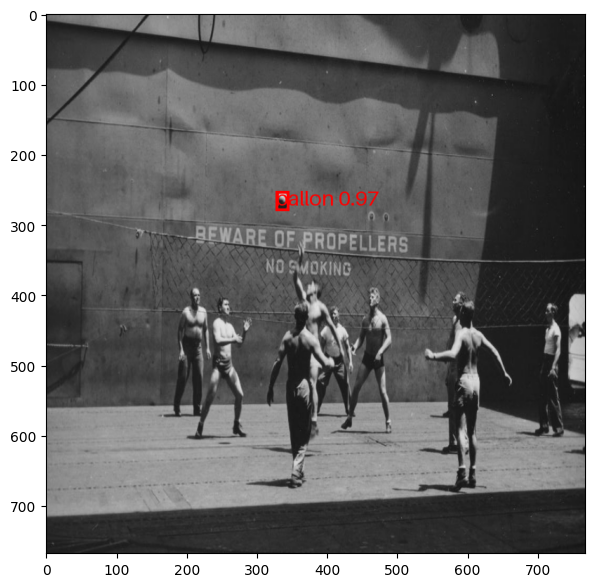

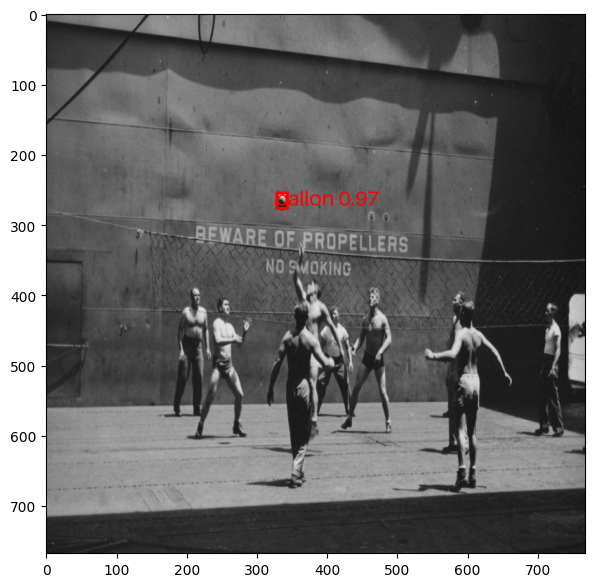

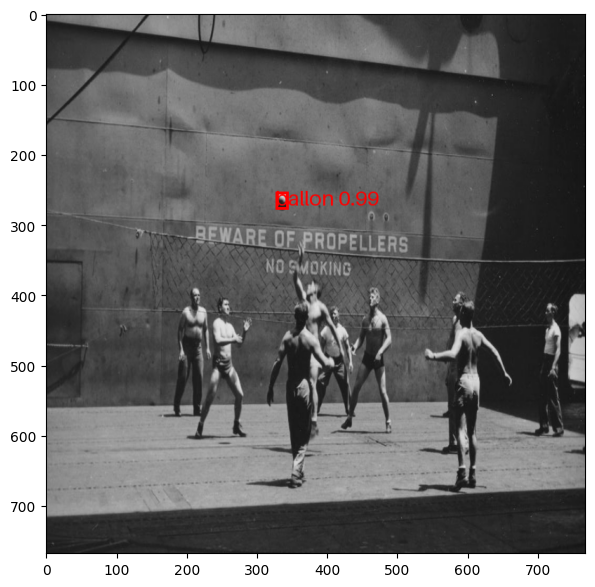

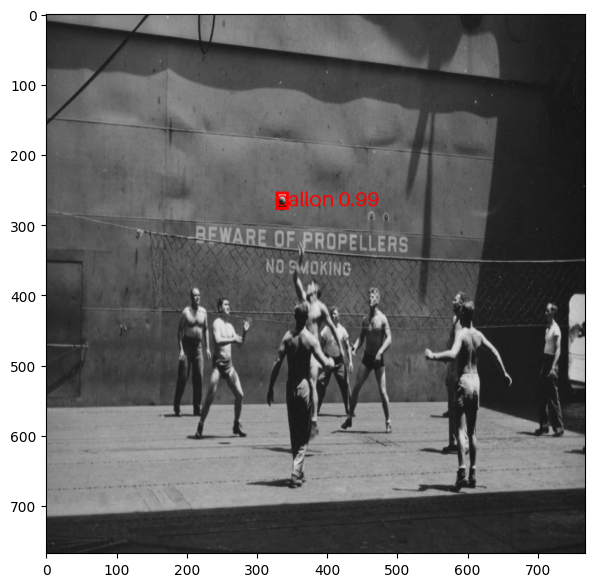

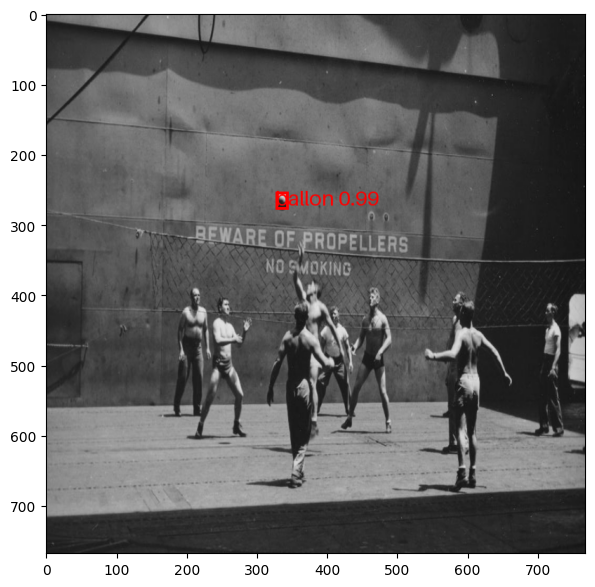

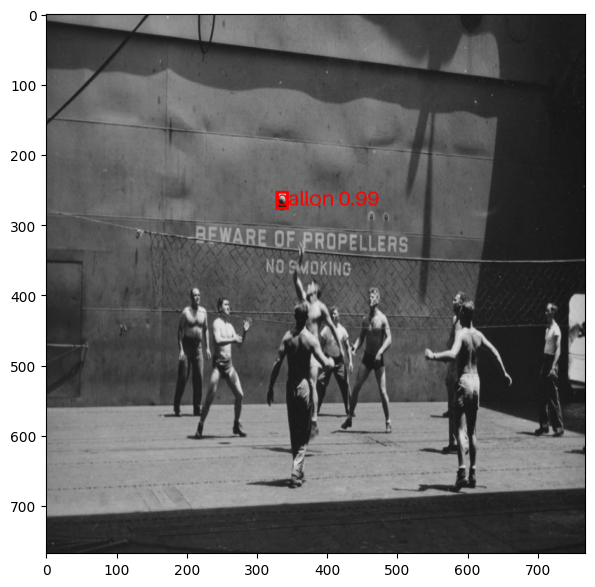

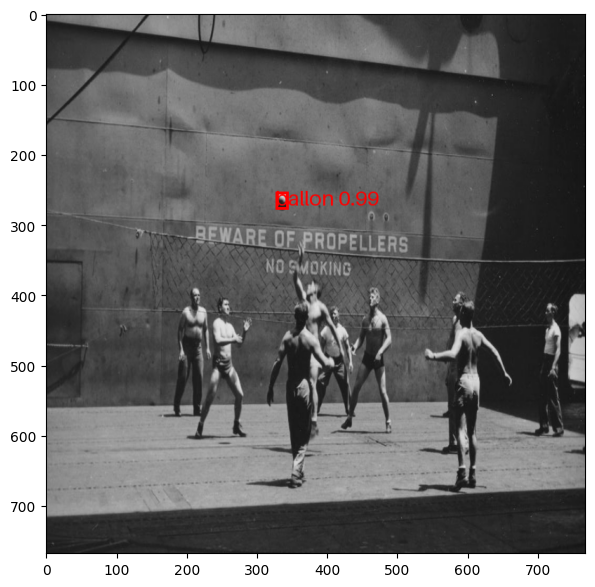

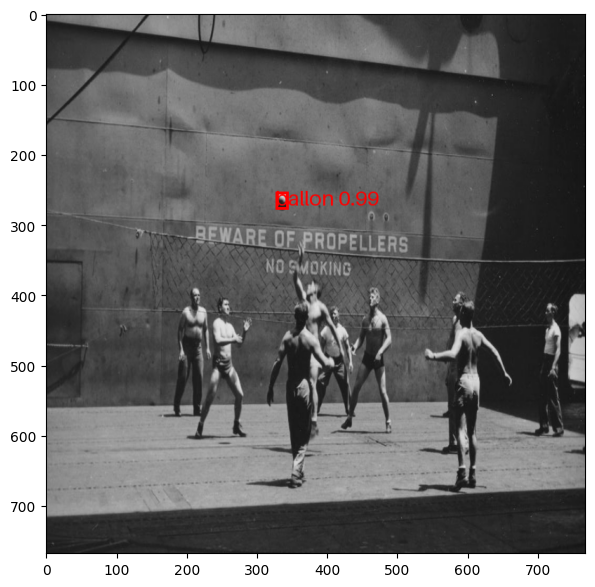

In [70]:
fit(epochs = 8, device = device,
    save_path = 'model_full_data_pretrained_fine_tuning.pth',
   best_val_loss = float('inf'), optimizer = torch.optim.SGD, optimizer_params = {'lr': 0.005, 
                                                   'momentum': 0.9,
                                                    'weight_decay': 0.0005},
    tensorboard_path = '/kaggle/working/faster_rcnn/runs/pre_trained_fine_tuning'
   )

#### Логирование Loss'ов в TensorBoard:

#### Train:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/directory/tb_logs_1.png" width="600" height="400" />

#### Val:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/directory/tb_logs_val_1.png" width="600" height="400" />

#### Тестирование модели на сэмпле:

Class: ballon, Score: 0.9978087544441223, Box: tensor([ 34.8902, 580.2974, 124.3313, 691.5663])


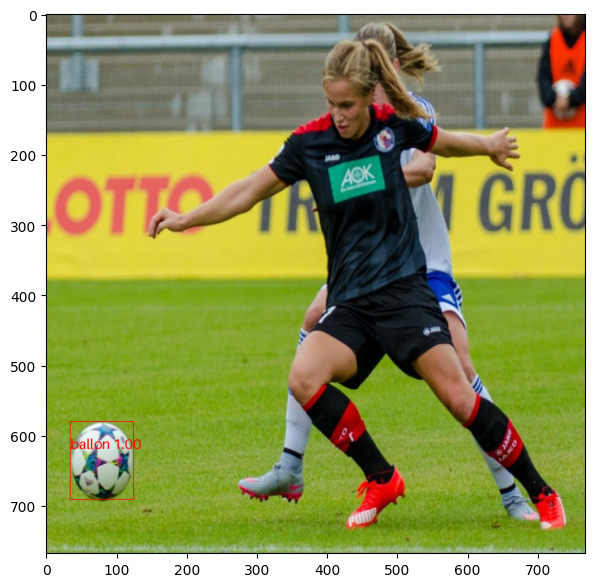

In [37]:
model.load_state_dict(torch.load('/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/directory/model_full_data_pretrained_fine_tuning.pth',
                                 map_location=torch.device('cpu')))
model.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0190.jpg',
                         detection_model = model, threshold = 0.7)

#### Predict сделан!

#### Ещё одна функция создания модели:

In [43]:
def create_model_initial(num_classes, pretrained_flag=False):
    if not pretrained_flag:
        model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)
        in_features = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    else:
        model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        in_features = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
        
    return model


In [44]:
torch.cuda.empty_cache()

#### Вторая модель (все веса обновляются):

In [47]:
model_pretrained_full = create_model_initial(num_classes = 2, pretrained_flag = True)
trainable_params = [name for name, param in model_pretrained_full.named_parameters() if param.requires_grad]
model_pretrained_full.load_state_dict(torch.load('/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/directory/ball_detection_model_pretrained_full.pth',
                                                 map_location=torch.device('cpu')))

print("Trainable parameters:")
for name in trainable_params:
    print(name)

Trainable parameters:
backbone.body.layer2.0.conv1.weight
backbone.body.layer2.0.conv2.weight
backbone.body.layer2.0.conv3.weight
backbone.body.layer2.0.downsample.0.weight
backbone.body.layer2.1.conv1.weight
backbone.body.layer2.1.conv2.weight
backbone.body.layer2.1.conv3.weight
backbone.body.layer2.2.conv1.weight
backbone.body.layer2.2.conv2.weight
backbone.body.layer2.2.conv3.weight
backbone.body.layer2.3.conv1.weight
backbone.body.layer2.3.conv2.weight
backbone.body.layer2.3.conv3.weight
backbone.body.layer3.0.conv1.weight
backbone.body.layer3.0.conv2.weight
backbone.body.layer3.0.conv3.weight
backbone.body.layer3.0.downsample.0.weight
backbone.body.layer3.1.conv1.weight
backbone.body.layer3.1.conv2.weight
backbone.body.layer3.1.conv3.weight
backbone.body.layer3.2.conv1.weight
backbone.body.layer3.2.conv2.weight
backbone.body.layer3.2.conv3.weight
backbone.body.layer3.3.conv1.weight
backbone.body.layer3.3.conv2.weight
backbone.body.layer3.3.conv3.weight
backbone.body.layer3.4.conv1

#### Код обучения:

In [ ]:
fit(epochs = 3, device = device, model_faster_rcnn = model_pretrained_full,
   optimizer = torch.optim.SGD, optimizer_params = {'lr': 0.0005, 
                                                   'momentum': 0.9,
                                                    'weight_decay': 0.0005}, save_path = '/kaggle/working/ball_detection_model_pretrained_full.pth',
   tensorboard_path = '/kaggle/working/faster_rcnn/runs/pretrained_full', 
   best_val_loss = 0.169)

In [ ]:
fit(epochs = 4, device = device, model_faster_rcnn = model,
   optimizer = torch.optim.SGD, optimizer_params = {'lr': 0.000725, 
                                                   'momentum': 0.9,
                                                    'weight_decay': 0.0005}, save_path = '/kaggle/working/ball_detection_model_pretrained_full.pth',
   tensorboard_path = '/kaggle/working/faster_rcnn/runs/pretrained_full', 
   best_val_loss = 0.168)

#### Predict:

Class: ballon, Score: 0.9949766397476196, Box: tensor([ 35.4185, 579.9078, 124.7763, 693.7169])


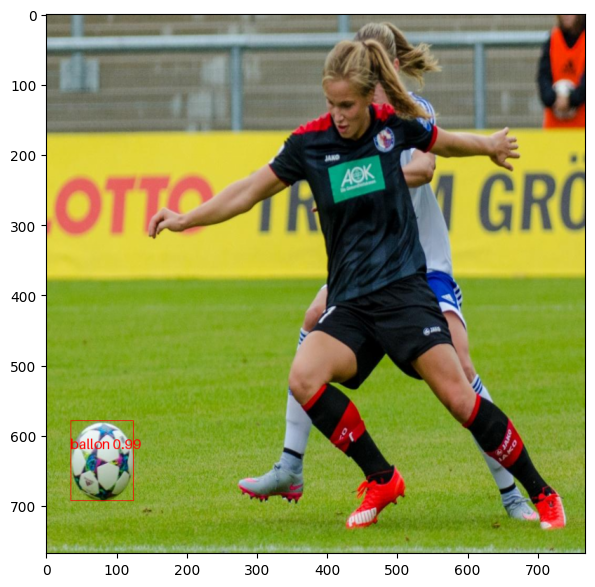

In [ ]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0190.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

#### Логирование Loss'ов в TensorBoard:

#### Train:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/directory/logs_2.png" width="600" height="400" />

#### Val:

<img src="/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/directory/logs_val_2.png" width="600" height="400" />

#### Сравнение моделей:

In [38]:
def loss_calc(model_faster_rcnn, test_loader, model_name):
    
	'''
	Функция для подсчета val_loss'а для модели (уже не на kaggle) 

	Параметры:
	-model_faster_rcnn: input Faster-RCNN модель
	-test_loader: тестовый даталоадер
	-model_name: название модели
	
	'''
	model_faster_rcnn.to(device)
	validation_loss = 0
	model_faster_rcnn.train()
	with torch.no_grad():
		for i, batch in enumerate(tqdm(test_loader)):
			images, labels = batch
			images = list(image.to(device) for image in images)
			labels = [{k: v.to(device) for k, v in t.items()} for t in labels]

			loss_dict = model_faster_rcnn(images, labels)
			losses = sum(loss for loss in loss_dict.values()) 
			validation_loss += losses.item()

		print(f'Validation sum of model {model_name} = {validation_loss/len(test_loader)}')


In [75]:
loss_calc(model,  val_data_loader, 'pretrained_tune_last_layers')

  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum of model pretrained_tune_last_layers = 0.28986888627211255


In [76]:
loss_calc(model_pretrained_full,  val_data_loader, 'pretrained_fine_tuned_full_data')

  0%|          | 0/15 [00:00<?, ?it/s]

Validation sum of model pretrained_fine_tuned_full_data = 0.19834783424933752


#### Loss 2-ой модели ниже!

#### И, наконец, третья модель. Готовая. Необученная:

In [39]:
def create_complete_model():
    
    '''Функция создания базовой модели'''
    
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    return model

model_basic = create_complete_model()

#### Predict:

Class: ballon, Score: 0.9997686743736267, Box: tensor([141.9610,  25.1429, 735.6964, 718.9265])
Class: sports ball, Score: 0.9994291663169861, Box: tensor([ 34.1096, 582.6116, 125.0536, 693.5778])
Class: ballon, Score: 0.9882391691207886, Box: tensor([699.7653,   0.9683, 766.3450, 160.4209])


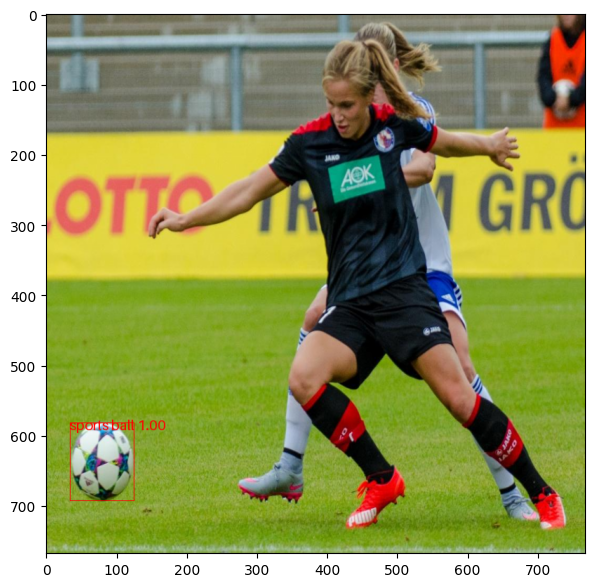

In [41]:
model_basic.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0190.jpg',
                         detection_model = model_basic, threshold = 0.9, base_use = True)

#### Train-loop реализован, несколько запусков сделаны

#### Значит, условие 2.1 выполнено! ✅

#### Kaggle moments:

In [78]:
!ls

ball_detection_model_pretrained_full.pth
faster_rcnn
model_full_data_pretrained_fine_tuning.pth


In [77]:
!cd /kaggle/working

In [ ]:
import zipfile
import os
from IPython.display import FileLink

def zip_dir(directory = os.curdir, file_name = 'directory.zip'):
    os.chdir(directory)
    zip_ref = zipfile.ZipFile(file_name, mode='w')
    for folder, _, files in os.walk(directory):
        for file in files:
            if file_name in file:
                pass
            else:
                zip_ref.write(os.path.join(folder, file))

    return FileLink(file_name)

In [80]:
zip_dir()

/kaggle/working/directory.zip

#### Тестирование на новом изображении. Матч Бауманской футбольной лиги:

Class: ballon, Score: 0.9887574315071106, Box: tensor([316.9829, 474.0707, 331.2686, 498.9739])


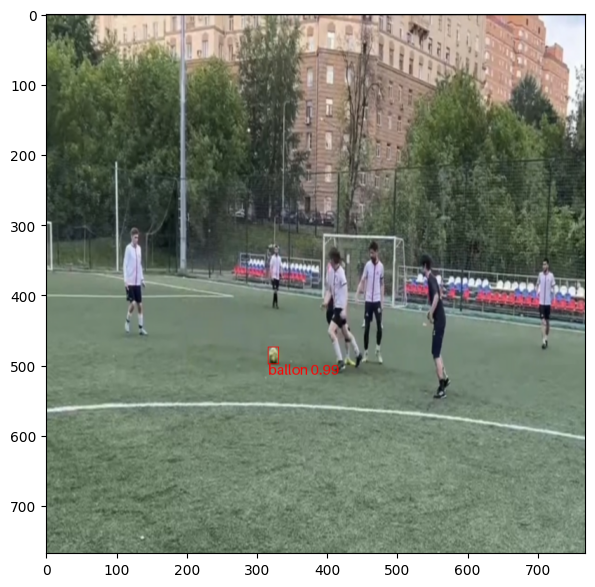

In [48]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/entropy_test.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

#### Мячик найден!

#### Считаем IoU для датасетов:

In [50]:
def get_iou(model, dataset, threshold = 0.85, fitted_flag = True):
		
		'''Функция считает IoU score для датасета'''

		device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
		model.to(device)
		model.eval()
		iou_scores = []

		for i in tqdm(range(len(dataset))):
			image, target = dataset[i]
			image = image.unsqueeze(0).to(device)

			with torch.no_grad():
				prediction = model(image)
			
			if fitted_flag:
				predicted_boxes = prediction[0]['boxes'].cpu()
				predicted_boxes_real = []

				for j, box in enumerate(predicted_boxes):
					if (prediction[0]['scores'][j] > threshold):
						predicted_boxes_real.append(box.tolist())
				predicted_boxes_real = torch.as_tensor(predicted_boxes_real)

				target_boxes = target['boxes']

				if len(predicted_boxes_real) == 0:
					pred = torch.zeros(4).unsqueeze(0)
					# print(pred)
					iou = box_iou(pred, target_boxes)

				else:
					iou = box_iou(predicted_boxes_real, target_boxes)
				iou_scores.append(iou)
			else:


				predicted_boxes = prediction[0]['boxes'].cpu()
				predicted_boxes_real = []

				for j, box in enumerate(predicted_boxes):
					if (prediction[0]['scores'][j] > threshold) and (int(prediction[0]['labels'][j]) == 37):
						predicted_boxes_real.append(box.tolist())
				predicted_boxes_real = torch.as_tensor(predicted_boxes_real)


				target_boxes = target['boxes']

				if len(predicted_boxes_real) == 0:
					pred = torch.zeros(4).unsqueeze(0)
					iou = box_iou(pred, target_boxes)

				else:
					iou = box_iou(predicted_boxes_real, target_boxes)
				iou_scores.append(iou)

		return iou_scores


#### Средний IoU для pretrained_full_model (все веса обновлялись):

In [173]:
iou_scores_list = get_iou(model_pretrained_full, test_dataset, threshold=0.97)

  0%|          | 0/226 [00:00<?, ?it/s]

In [ ]:
val = []
for image in iou_scores_list:
    for detect in image:
        val.append(max(detect))
print(f'Mean IoU on test data: {np.mean(val)}')

Mean IoU on test data: 0.693943977355957


#### Средний IoU для pretrained_full_model (веса замораживались):

In [176]:
iou_scores_list = get_iou(model, test_dataset, threshold=0.97)

  0%|          | 0/226 [00:00<?, ?it/s]

In [ ]:
val = []
for image in iou_scores_list:
    for detect in image:
        val.append(max(detect))
print(f'Mean IoU on test data using fine tuned pretrained model: {np.mean(val)}')

Mean IoU on test data using fine tuned pretrained model: 0.6051599979400635


#### И для базовой модели:

In [51]:
iou_scores_list = get_iou(model_basic, test_dataset, threshold=0.97, fitted_flag=False)

  0%|          | 0/226 [00:00<?, ?it/s]

In [ ]:
val = []
for image in iou_scores_list:
    for detect in image:
        print(detect)
        val.append(max(detect))
print(f'Mean IoU on test data using based model: {np.mean(val)}')

Mean IoU on test data using based model: 0.2814974784851074


#### По среднему IoU модель №2 обучилась лучше всех.

#### Сравнение моделей по Loss'у и IoU произведено, условие 2.2 выполнено ✅

#### Mean Average Precision:

In [56]:
def map_calc(dataset = test_dataset, model = model_pretrained_full):

    device = "cpu"
    model.to(device)
    predict_list=[]
    target_list=[]

    model.eval()
    for i in tqdm(range(len(dataset))):
        img, target = dataset[i]
        img = img.unsqueeze(0).to(device)
        with torch.no_grad():
            prediction = model(img)
        predict_list.append(prediction[0])
        target_list.append(target)
    metric = MeanAveragePrecision()
    metric.update(predict_list, target_list)
    metrics = metric.compute()
    return metrics

metrics = map_calc()

  0%|          | 0/226 [00:00<?, ?it/s]

#### mAP для класса мяч (лучшая модель):

In [58]:
metrics

{'map': tensor(0.5237),
 'map_50': tensor(0.8073),
 'map_75': tensor(0.5643),
 'map_small': tensor(0.3734),
 'map_medium': tensor(0.5583),
 'map_large': tensor(0.7134),
 'mar_1': tensor(0.3155),
 'mar_10': tensor(0.6033),
 'mar_100': tensor(0.6283),
 'mar_small': tensor(0.4473),
 'mar_medium': tensor(0.6533),
 'mar_large': tensor(0.8366),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor(1, dtype=torch.int32)}

In [59]:
metrics = map_calc(model = model)

  0%|          | 0/226 [00:00<?, ?it/s]

#### mAP для замороженной модели:

In [60]:
metrics

{'map': tensor(0.4532),
 'map_50': tensor(0.6921),
 'map_75': tensor(0.5132),
 'map_small': tensor(0.2806),
 'map_medium': tensor(0.4957),
 'map_large': tensor(0.6625),
 'mar_1': tensor(0.2845),
 'mar_10': tensor(0.5495),
 'mar_100': tensor(0.5660),
 'mar_small': tensor(0.3462),
 'mar_medium': tensor(0.6141),
 'mar_large': tensor(0.7902),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor(1, dtype=torch.int32)}

#### mAP посчитан, значит, условие 3.1. выполнено! ✅

#### Визуальная оценка:

Class: ballon, Score: 0.8870921730995178, Box: tensor([ 39.0688, 205.9543, 232.0922, 390.0967])
Class: ballon, Score: 0.8695651292800903, Box: tensor([250.8210, 450.8864, 493.0066, 687.7350])
Class: ballon, Score: 0.8147779703140259, Box: tensor([172.2789, 101.6631, 346.6173, 291.0461])
Class: ballon, Score: 0.7961328029632568, Box: tensor([439.4301, 350.0026, 653.7968, 571.4276])


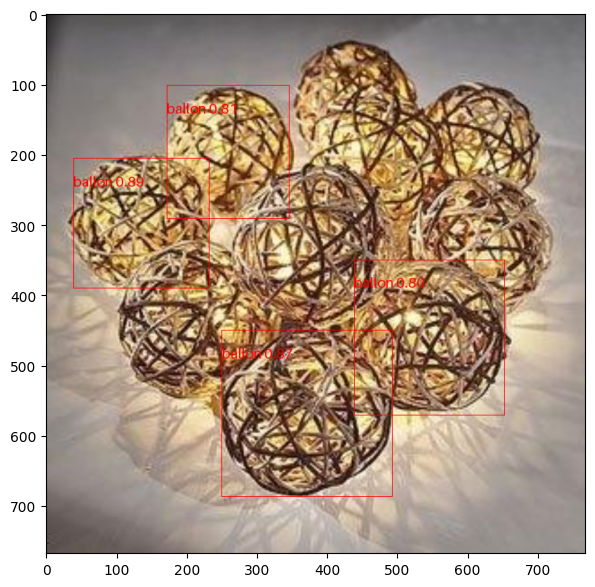

In [61]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0191.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

Class: ballon, Score: 0.992339015007019, Box: tensor([647.6989, 593.2978, 676.1494, 638.1827])
Class: ballon, Score: 0.992262601852417, Box: tensor([543.5721, 697.2731, 577.6217, 753.1135])
Class: ballon, Score: 0.9852146506309509, Box: tensor([679.1494, 602.5497, 709.1238, 651.2161])
Class: ballon, Score: 0.8434866666793823, Box: tensor([620.6332, 569.7906, 648.1312, 595.4129])


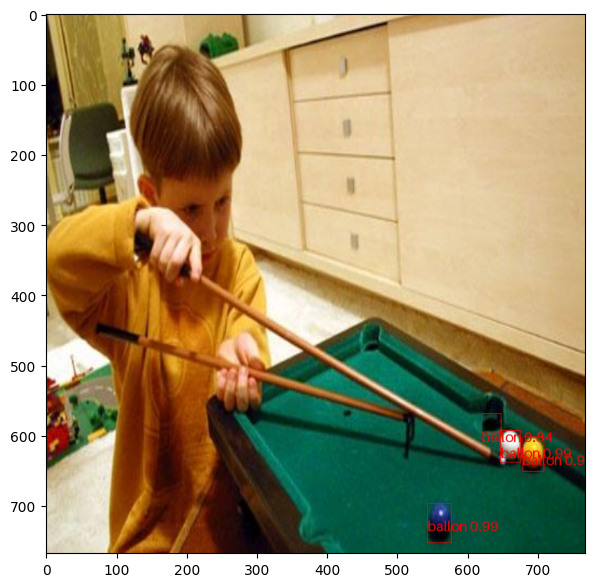

In [62]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0195.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

Class: ballon, Score: 0.9977577328681946, Box: tensor([185.5244, 497.4411, 239.6683, 588.8696])


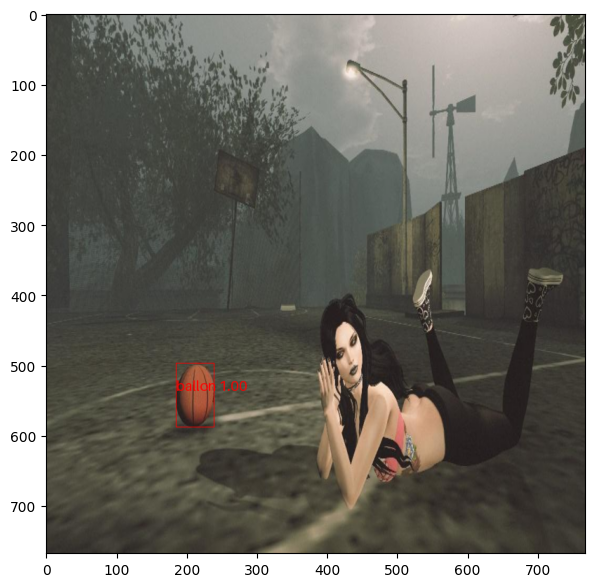

In [63]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0199.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

Class: ballon, Score: 0.9966782331466675, Box: tensor([397.1989, 280.8012, 455.5957, 370.9591])
Class: ballon, Score: 0.996537446975708, Box: tensor([184.6051, 526.6543, 241.4844, 618.1713])
Class: ballon, Score: 0.9146655201911926, Box: tensor([434.6991, 260.6123, 464.6383, 298.1280])


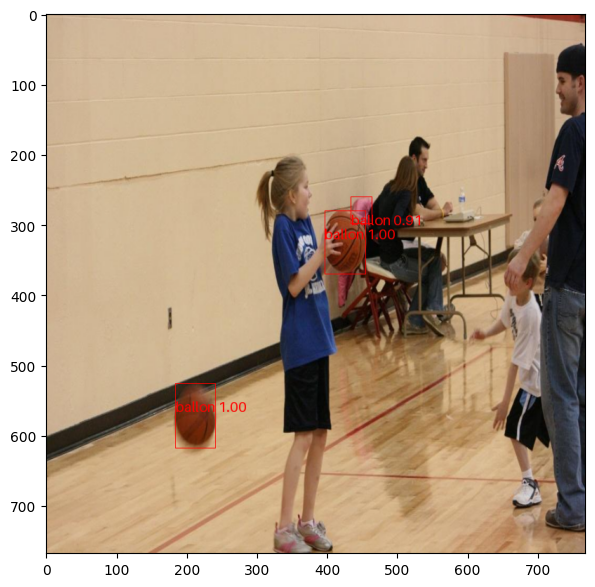

In [64]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0185.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

Class: ballon, Score: 0.9615619778633118, Box: tensor([  0.,   0., 768., 768.])
Class: ballon, Score: 0.9551047682762146, Box: tensor([501.3601,   1.3074, 675.3887, 272.7106])
Class: ballon, Score: 0.9329814910888672, Box: tensor([199.0626, 159.4399, 393.8020, 474.9634])
Class: ballon, Score: 0.9316775798797607, Box: tensor([562.9860, 577.8387, 752.8160, 767.4813])
Class: ballon, Score: 0.9305813312530518, Box: tensor([549.1346, 331.1170, 740.0261, 607.1325])
Class: ballon, Score: 0.8784865140914917, Box: tensor([632.6610, 124.8490, 767.7614, 420.1120])
Class: ballon, Score: 0.8676328659057617, Box: tensor([337.0344, 391.2136, 527.0577, 690.1922])
Class: ballon, Score: 0.8656362891197205, Box: tensor([330.1119,   3.1253, 497.4107, 258.6337])
Class: ballon, Score: 0.8613385558128357, Box: tensor([ 56.8273, 363.2791, 243.5650, 660.7101])
Class: ballon, Score: 0.8566601276397705, Box: tensor([  4.9783, 613.5282, 199.5569, 768.0000])
Class: ballon, Score: 0.7514896392822266, Box: tensor([ 

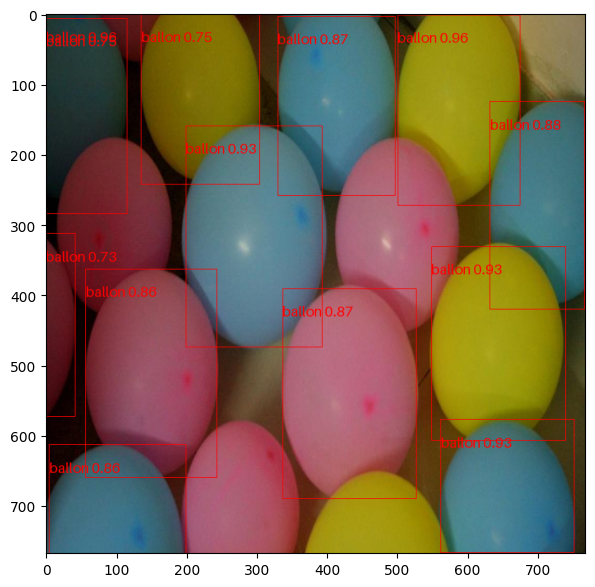

In [66]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0180.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

Class: ballon, Score: 0.9961912631988525, Box: tensor([510.2701, 326.0605, 647.3244, 533.3095])


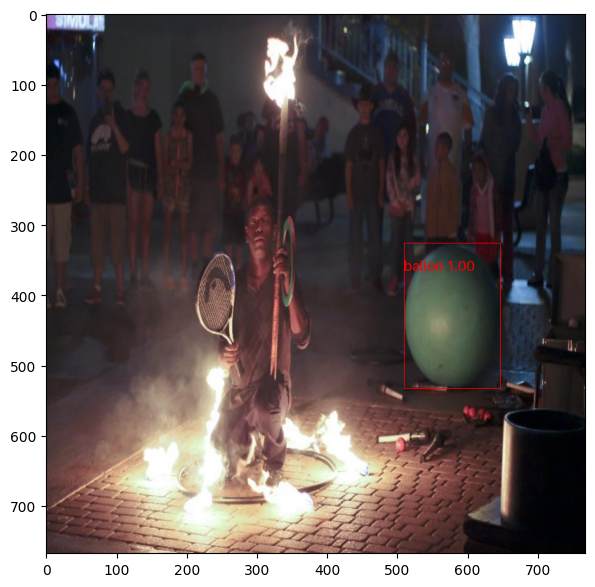

In [67]:
model_pretrained_full.eval()
example = detect_visualize(image_path = '/Users/chervonikov_alexey/Desktop/projects/Technopark_Autumn_2024/Нейронки/object_detection/seminar_objdet_retina_oi5_ball/augmented_dataset_test/images/0201.jpg',
                         detection_model = model_pretrained_full, threshold = 0.7)

### Резюме ✅

Итак, в ходе исследования было обучено две модели Faster-RCNN. В одной обновлялись все веса, во второй - только классификационный слой. Первая модель сумела адаптироваться под поставленную задачу и показала большую точность по основным ключевым метрикам.

Основные моменты:

* Использование принятых методов оптимизации не всегда + к решению задачи. Пусть это не отражено в ноутбуке, но тестирование Adam в этой задаче привело к более низкой точности в сравнении с простым, казалось бы, SGD. Для случая предсказания одного класса, возможно, и не нужны такие продвинутые методы для достижения сходимости loss'а.

* Использование предобучения помогает быстрее доситичь поставленных результатов. Начиная из соотношения параметров, полученных в ходе решения похожей задачи, модель быстрее адаптируется к частной задаче и за 1-2 эпохи уже может показывать высокий score.

* У модели есть проблемы с точностью при большом количестве предсказываемых объектов на фотографиях, при их "кучном" расположении. Возможно, эту проблему можно решить используя patched подоход, разбивая изображения на небольший патчи и предсказывая объекты внутри них. Возможно, есть смысл попробовать алгоритмы семейства SSD.

* У модели есть проблемы с ошибками классификации объектов, не являющихся мячами. Например, тени, головы людей, шарообразные объекты. В принципе, это можно исправить дополнительной разметкой. (Например, разметить тени, как тени, головы, как головы). Тогда модель научится отедлять одно от другого. Можно также модифицировать функцю потерь, введя дополнительный штраф за ложную классификацию регрессию. Или попробовать новую архитектуру.

* Также есть смысл в дополнительных аугментациях (афинные преобразования, контраст, угловой поворот).